In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import pickle
import glob
%matplotlib inline

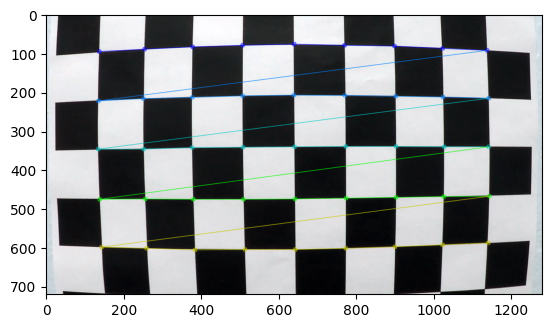

In [2]:
# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 5#TODO: enter the number of inside corners in y

objpoints = []
imgpoints = []

objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)


# Make a list of calibration images
# img = mpimg.imread('resources/camera_cal/calibration1.jpg')
images = glob.glob('D:/Academic stuff/MSIS Github/Road-detection/lane-detection-with-opencv-master/resources/camera_cal/*.jpg')

for idx, fname in enumerate(images):
    # Read in an image
    img = cv2.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

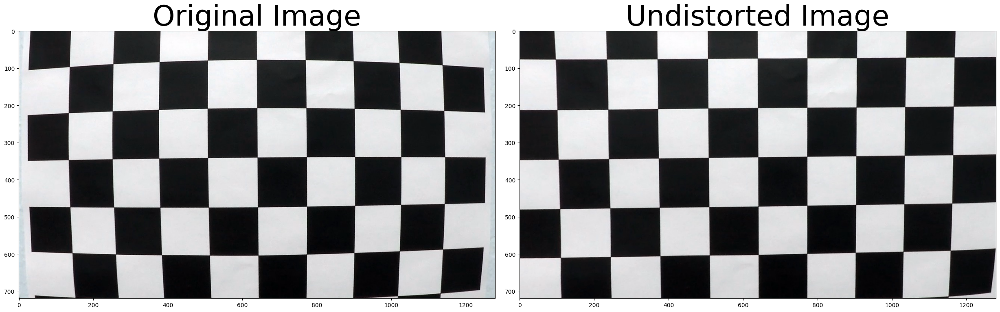

In [3]:
# Takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

# Get test image
img = cv2.imread('D:/Academic stuff/MSIS Github/Road-detection/lane-detection-with-opencv-master/resources/camera_cal/calibration1.jpg')

undistorted, mtx, dist = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [4]:
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_pickle.p", "wb" ) )

## Select test image

In [6]:
# Read in an image
img = mpimg.imread('D:/Academic stuff/MSIS Github/Mini-project-data/Dataset/Structured/frame60608_leftImg8bit.jpg')
img = cv2.resize(img, (1280, 720))

## Define Plot Function
This function is used during the pipeline building process to show the difference between the original and procsessed images.

In [7]:
def plot_images(original, modified, title):
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(modified, cmap='gray')
    ax2.set_title(title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use Calibrated Camera to Undistort Lane Images
Undistort leverages the camera matrix and distance coefficients that we calculated from the chessboard image to undistort any image we pass it.

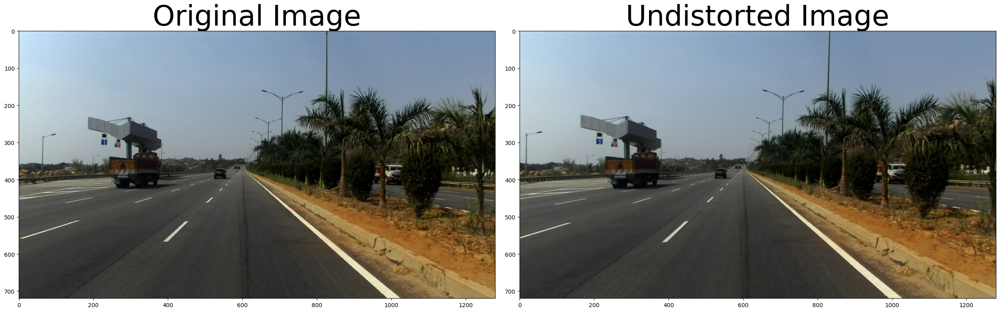

In [8]:
def undistort(img):
    #Load pickle
    dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]

    # Undistort sample image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted

# undistort it
undistorted = undistort(img)

# printing out some stats and plotting
plot_images(img, undistorted, 'Undistorted Image')

## Build Bounding Box for Perspective Transform
In order to find the correct points for the bounding box that I use in the perspective transform step, I tried drawing the box onto an image of a moderately straight section of highway. My goal was to capture all of the lane, but not get too close to the horizon as that tended to result in lane confusion on exceptionally curvy highway images.

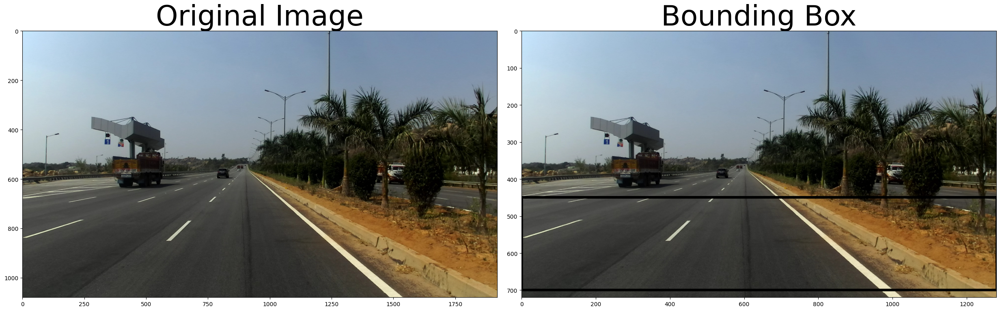

In [10]:
image = "D:/Academic stuff/MSIS Github/Mini-project-data/Dataset/Structured/frame60608_leftImg8bit.jpg"
#D:\Academic stuff\MSIS Github\Mini-project-data\Camera data for unstructured roads\IMG20221011120555.jpg
test_img = mpimg.imread(image)
test_img = cv2.resize(test_img, (1280, 720))
points = [(0, 450), (1280,450), (1280, 700), (0, 700)]
cv2.line(test_img, points[0], points[1], 0, 5)
cv2.line(test_img, points[1], points[2], 0, 5)
cv2.line(test_img, points[2], points[3], 0, 5)
cv2.line(test_img, points[3], points[0], 0, 5)
plot_images(mpimg.imread(image), test_img, "Bounding Box")

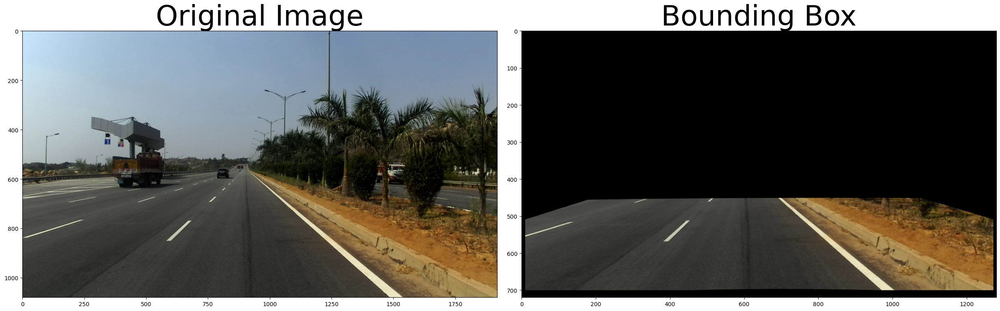

In [11]:
## CREATING MASK FOR THE ROAD ##
def mask(img):
    img_mask = np.zeros(img.shape[:2], dtype="uint8")
    #img_mask = np.zeros_like(img)
    lane_shape = np.array([[10, 510], [200, 450], [1070, 450], [1270, 510], [1270, 700], [10, 700]]) 			#Creating a mask for the road
    cv2.fillConvexPoly(img_mask, lane_shape, 255)								#The generated mask will be white
    masked_img = cv2.bitwise_and(img, img, mask = img_mask)
    return masked_img

cur_img = undistort(test_img)
masked_image = mask(cur_img)
plot_images(mpimg.imread(image), masked_image, "Bounding Box")

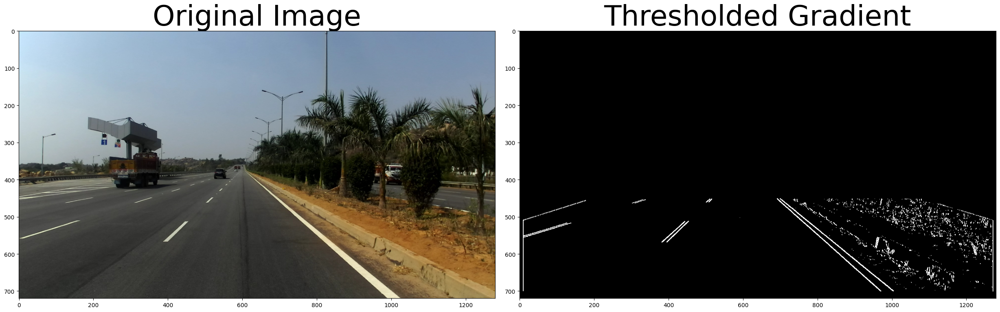

In [12]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary
    
# Run the function
grad_binary = abs_sobel_thresh(masked_image, orient='x', sobel_kernel=3, thresh=(21,255))
# Plot the result
plot_images(img, grad_binary, 'Thresholded Gradient')

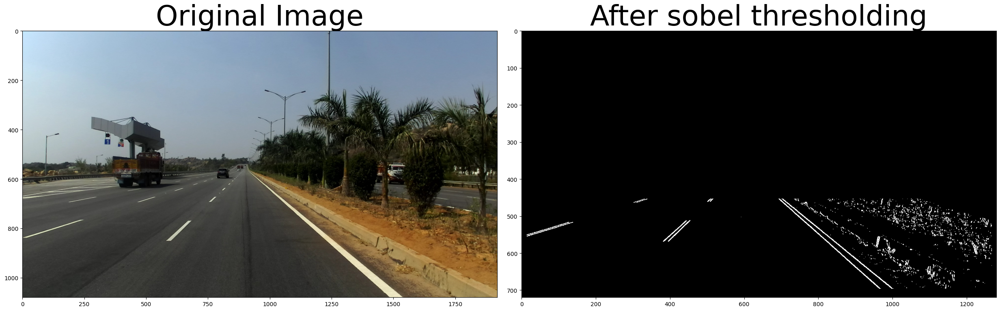

In [17]:
def bounding_box(grad_binary):
    points = [(10, 510), (200, 450), (1070,450), (1270, 510), (1270, 700), (10, 700)]
    cv2.line(grad_binary, points[0], points[1], 0, 5)
    cv2.line(grad_binary, points[1], points[2], 0, 5)
    cv2.line(grad_binary, points[2], points[3], 0, 5)
    cv2.line(grad_binary, points[3], points[4], 0, 5)
    cv2.line(grad_binary, points[4], points[5], 0, 5)
    cv2.line(grad_binary, points[5], points[0], 0, 5)
    return grad_binary
grad_binary = bounding_box(grad_binary)
plot_images(mpimg.imread(image), grad_binary, "After sobel thresholding")
# Plot the result

## Apply Perspective Transform
Next, I use this bounding box to compute a perspective transformed (or "bird's eye view") version of the road image. This was one of the more challenging aspects of the project. I wanted to get a more accurate transform than I currently have, but I realized that my lane detection could still be accurate with an imperfect transform.

While working on this aspect of the pipeline, I found it helpful to compute the transform on a collection of sample images. The transform works pretty well on straight roads, but fails to transform curvy road segments accurately.

Given more time, I would use other computer vision techniques to compute the bounding box dynamically. For instance, I could use Hough lines to get a rough estimate of the lane location and horizon for computing a bounding box that adjusts for different images.

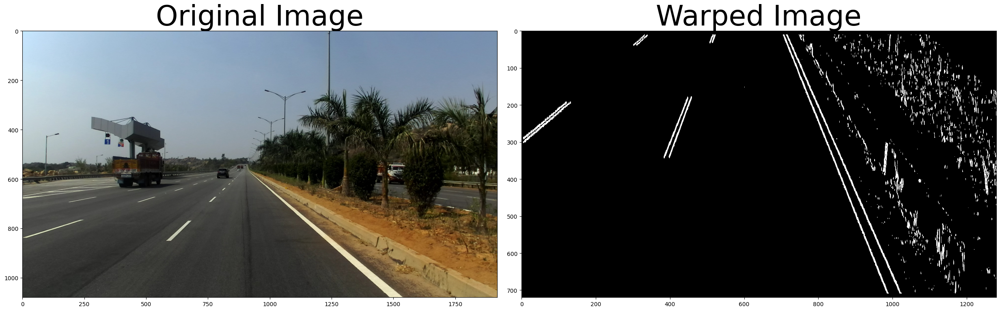

In [16]:
def perspective_transform(img, mtx, dist, isColor=True):
    # Use the OpenCV undistort() function to remove distortion
    #undist = cv2.undistort(img, mtx, dist, None, mtx)
    '''
    if(isColor):
        # Convert undistorted image to grayscale
        gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    else:
        gray = undist
    '''
    xoffset = 0 # offset for dst points
    yoffset = 0
    img_size = (img.shape[1], img.shape[0])
    #img_size = (undist.shape[1], undist.shape[0])

    src = np.float32([[(10, 450), (1250,450), (1250, 700), (10, 700)]])
    #src = np.float32([(500, 450), (830,450), (1200, 700), (140, 700)])
    dst = np.float32([[xoffset, yoffset], [img_size[0]-xoffset, yoffset], 
                                 [img_size[0]-xoffset, img_size[1]-yoffset], 
                                 [xoffset, img_size[1]-yoffset]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    # Return the resulting image and matrix
    return warped, M

def inv_perspective_warp(img, 
                     dst_size=(1280,720),
                     src=np.float32([(0,0), (1, 0), (0,1), (1,1)]),
                     dst=np.float32([(0.43,0.65),(0.58,0.65),(0.1,1),(1,1)])):
    img_size = np.float32([(img.shape[1],img.shape[0])])
    src = src* img_size
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = dst * np.float32(dst_size)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, dst_size)
    return warped
               
#Load pickle
dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

#cur_img = undistort(grad_binary)
transform, M = perspective_transform(grad_binary, mtx, dist)
plot_images(mpimg.imread(image), transform, "Warped Image")

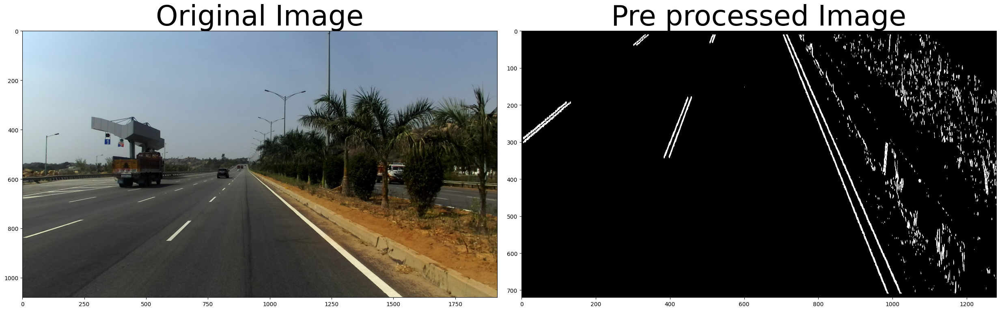

In [15]:
def preprocessing(img):
    undistorted_image = undistort(img)
    masked_image = mask(undistorted_image)
    sobel_thresholded_image = abs_sobel_thresh(masked_image, orient='x', sobel_kernel=3, thresh=(21,255))
    bounded_image = bounding_box(sobel_thresholded_image)
    dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    transform, M = perspective_transform(bounded_image, mtx, dist)
    return transform

testing = mpimg.imread(image)
testing = cv2.resize(testing, (1280, 720))
preprocessed = preprocessing(testing)
plot_images(mpimg.imread(image), preprocessed, "Pre processed Image")
    

In [22]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

C:\Users\adshi\AppData\Local\Temp\ipykernel_14756\2109069535.py:8: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  midpoint = np.int(histogram.shape[0]//2)
C:\Users\adshi\AppData\Local\Temp\ipykernel_14756\2109069535.py:21: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the releas

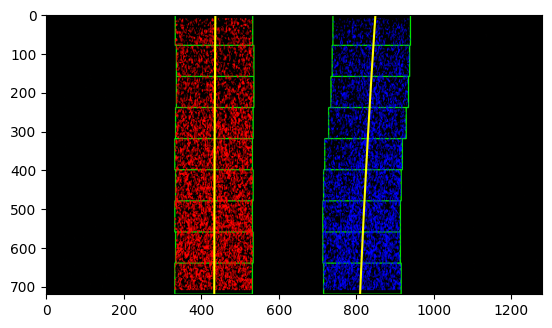

In [23]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, (left_fitx, right_fitx), (left_fit, right_fit), ploty


out_img, curves, lanes, ploty = fit_polynomial(transform)
plt.imshow(out_img)

In [24]:
def get_curve(img, leftx, rightx):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    y_eval = np.max(ploty)
    ym_per_pix = 30.5/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/720 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    car_pos = img.shape[1]/2
    l_fit_x_int = left_fit_cr[0]*img.shape[0]**2 + left_fit_cr[1]*img.shape[0] + left_fit_cr[2]
    r_fit_x_int = right_fit_cr[0]*img.shape[0]**2 + right_fit_cr[1]*img.shape[0] + right_fit_cr[2]
    lane_center_position = (r_fit_x_int + l_fit_x_int) /2
    center = (car_pos - lane_center_position) * xm_per_pix / 10
    # Now our radius of curvature is in meters
    return (left_curverad, right_curverad, center)

def draw_lanes(img, left_fit, right_fit):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    color_img = np.zeros_like(img)
    
    left = np.array([np.transpose(np.vstack([left_fit, ploty]))])
    right = np.array([np.flipud(np.transpose(np.vstack([right_fit, ploty])))])
    points = np.hstack((left, right))
    
    cv2.fillPoly(color_img, np.int_(points), (0,200,255))
    inv_perspective = inv_perspective_warp(color_img)
    inv_perspective = cv2.addWeighted(img, 1, inv_perspective, 0.7, 0)
    return inv_perspective

(2, 720)
(42507.519989684, 10405.081067503323, 0.32088009378751586)


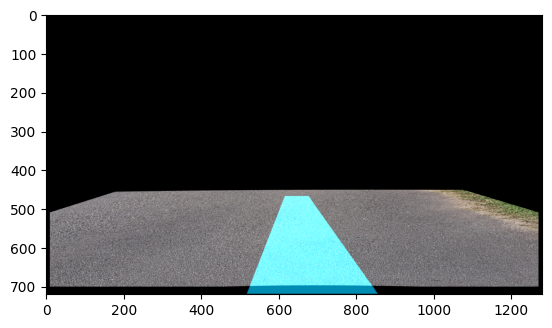

In [25]:
print(np.asarray(curves).shape)
curverad = get_curve(masked_image, curves[0],curves[1])
print(curverad)
newimg = draw_lanes(masked_image, curves[0], curves[1])
plt.imshow(newimg, cmap='hsv')